<a href="https://colab.research.google.com/github/faisu6339-glitch/Real_World-Projects/blob/main/Cassava(ShuffleNet1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
dataset_path = '/content/dataset_sir/main_dataset'

In [ ]:
!pip install -q tensorflow pandas scikit-learn matplotlib

import os
import json
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.applications.mobilenet_v3 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, BatchNormalization
from tensorflow.keras.models import Model

print("TensorFlow:", tf.__version__)

TensorFlow: 2.20.0


In [ ]:
import os

print(os.listdir(dataset_path))

['label_num_to_disease_map.json', 'Train', 'Test']


### Error: File Not Found

The `FileNotFoundError` indicates that the path specified for your dataset (`/content/drive/MyDrive/dataset_sir/main_dataset`) does not exist or is incorrect. This often happens if the folder names or structure in your Google Drive do not exactly match the path defined in the notebook.

Please verify the exact path to your `main_dataset` folder in your Google Drive. You can use the cell below to list the contents of your `/content/drive/MyDrive` folder to help you locate it.

Once you find the correct path, you will need to update the `dataset_path` variable in cell `ZWCTg7NqPRm9` and the `BASE_PATH` variable in cell `T1VXQRz-RR6i`.

In [ ]:
print("Contents of /content/drive/MyDrive:")
!ls -F "/content/drive/

Contents of /content/drive/MyDrive:
'Colab Notebooks'/	   'Untitled form.gform'
 file.pdf		   'Untitled project.gscript'
 main_dataset.zip	   'Untitled spreadsheet (1).gsheet'
 Products.gsheet	   'Untitled spreadsheet (2).gsheet'
 Products.pdf		   'Untitled spreadsheet (3).gsheet'
'Untitled form (1).gform'  'Untitled spreadsheet.gsheet'


In [ ]:
# Unzip the main_dataset.zip file
!unzip -q "/content/drive/MyDrive/main_dataset.zip" -d "/content/"

replace /content/dataset_sir/main_dataset.zip? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace /content/dataset_sir/main_dataset/label_num_to_disease_map.json? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace /content/dataset_sir/main_dataset/Test/Test.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace /content/dataset_sir/main_dataset/Test/Test_images/1004826518.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace /content/dataset_sir/main_dataset/Test/Test_images/1012257169.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace /content/dataset_sir/main_dataset/Test/Test_images/1012426959.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace /content/dataset_sir/main_dataset/Test/Test_images/101253257.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace /content/dataset_sir/main_dataset/Test/Test_images/1014492188.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace /content/dataset_sir/main_dataset/Test/Test_images/1021655183.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace /conte

In [ ]:
print("Contents of /content/:")
!ls -F "/content/"

Contents of /content/:
dataset_sir/  drive/  sample_data/


In [ ]:
import pandas as pd

In [ ]:
BASE_PATH = '/content/dataset_sir/main_dataset'

TRAIN_CSV = BASE_PATH + "/Train/Train.csv"
TRAIN_DIR = BASE_PATH + "/Train/Train_Images"

TEST_CSV = BASE_PATH + "/Test/Test.csv"
TEST_DIR = BASE_PATH + "/Test/Test_images"

LABEL_JSON = BASE_PATH + "/label_num_to_disease_map.json"

In [ ]:
train_df = pd.read_csv(TRAIN_CSV)
test_df = pd.read_csv(TEST_CSV)

with open(LABEL_JSON, "r") as f:
    label_map = json.load(f)

print("Train data:")
print(train_df.head())

print("Test data:")
print(test_df.head())

print("Label map:")
print(label_map)

print("Train columns:", train_df.columns)
print("Test columns:", test_df.columns)


Train data:
               ID  Labels
0  1758913732.jpg       3
1  1241243048.jpg       0
2  3761100385.jpg       2
3  3055614106.jpg       3
4  2386589588.jpg       4
Test data:
               ID  Labels
0  2595356168.jpg       3
1   794817264.jpg       0
2  4270972443.jpg       4
3  3540803278.jpg       0
4  2142522228.jpg       3
Label map:
{'0': 'CBB', '1': 'CBSD', '2': 'CGM', '3': 'CMD', '4': 'Healthy'}
Train columns: Index(['ID', 'Labels'], dtype='object')
Test columns: Index(['ID', 'Labels'], dtype='object')


#Counts the Total Numbers of Labels

In [ ]:
train_df["Labels"] = train_df["Labels"].astype(int)
test_df["Labels"] = test_df["Labels"].astype(int)

num_classes = len(label_map)

print("Number of classes:", num_classes)
print("Train class count:")
print(train_df["Labels"].value_counts())

Number of classes: 5
Train class count:
Labels
3    800
0    800
2    800
4    800
1    800
Name: count, dtype: int64


#Counts Total numbers of Taining and Test Images

In [ ]:
print("Number of classes:", num_classes)

print("\nTotal images:")
print("Train:", len(train_df))
print("Test:", len(test_df))

print("\nClass distribution (Train):")
print(train_df["Labels"].value_counts())

Number of classes: 5

Total images:
Train: 4000
Test: 1000

Class distribution (Train):
Labels
3    800
0    800
2    800
4    800
1    800
Name: count, dtype: int64


#label mapping

In [ ]:
import json

with open(LABEL_JSON, 'r') as f:
    label_map = json.load(f)

print(label_map)

{'0': 'CBB', '1': 'CBSD', '2': 'CGM', '3': 'CMD', '4': 'Healthy'}


Convert labels → actual names

In [ ]:
for k, v in label_map.items():
    print(f"Label {k} → {v}")



Label 0 → CBB
Label 1 → CBSD
Label 2 → CGM
Label 3 → CMD
Label 4 → Healthy


In [ ]:
counts = train_df["Labels"].value_counts().sort_index()

for label, count in counts.items():
    print(f"{label_map[str(label)]} → {count}")

CBB → 800
CBSD → 800
CGM → 800
CMD → 800
Healthy → 800


In [ ]:
print("Train Class Distribution (from DataFrame):")
counts_from_df = train_df["Labels"].value_counts().sort_index()
for label, count in counts_from_df.items():
    print(f"{label_map[str(label)]} → {count}")

Train Class Distribution (from DataFrame):
CBB → 800
CBSD → 800
CGM → 800
CMD → 800
Healthy → 800


In [ ]:
import os

train_dir = '/content/drive/MyDrive/dataset_sir/main_dataset/Train'
test_dir = '/content/drive/MyDrive/dataset_sir/main_dataset/Test'

def count_images(folder):
    total = 0
    for root, dirs, files in os.walk(folder):
        images = [f for f in files if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        total += len(images)
    return total

print("Total Train Images:", count_images(train_dir))
print("Total Test Images:", count_images(test_dir))

Total Train Images: 0
Total Test Images: 0


#Plotting the Barplot to see all the class image

In [ ]:
counts = train_df["Labels"].value_counts().sort_index()
names = [label_map[str(i)] for i in counts.index]
values = counts.values

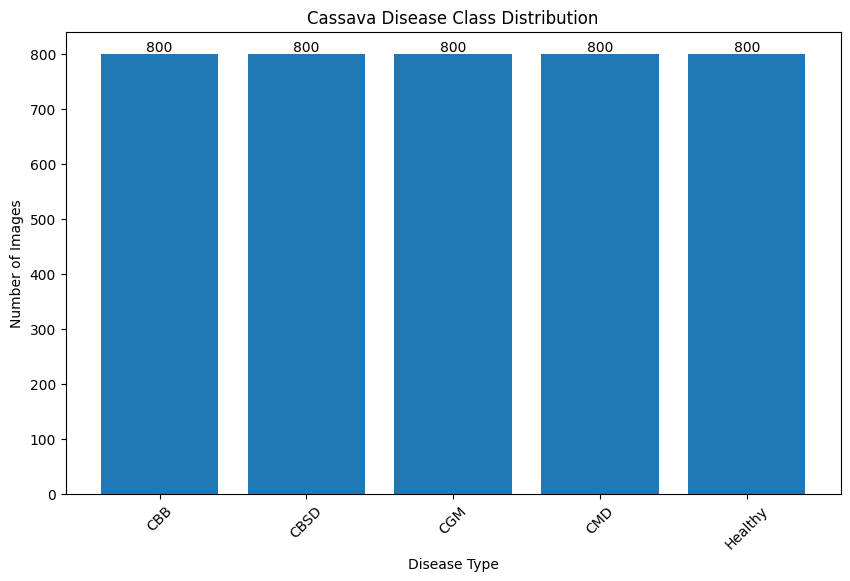

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

plt.bar(names, values)

plt.title("Cassava Disease Class Distribution")
plt.xlabel("Disease Type")
plt.ylabel("Number of Images")

plt.xticks(rotation=45)

# Add values on top
for i, v in enumerate(values):
    plt.text(i, v + 5, str(v), ha='center')

plt.show()

#Function to Access the single images

In [ ]:
print(train_df["Labels"].unique())
print(train_df["Labels"].dtype)

[3 0 2 4 1]
int64


In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os

def show_one_image(class_id):
    row = train_df[train_df["Labels"] == class_id].iloc[0]

    img_path = os.path.join(TRAIN_DIR, row["ID"])
    img = Image.open(img_path)

    plt.imshow(img)
    plt.title(label_map[str(class_id)])
    plt.axis("off")
    plt.show()

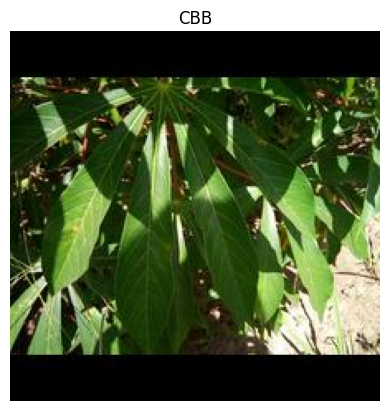

In [ ]:
show_one_image(0)   # change class id

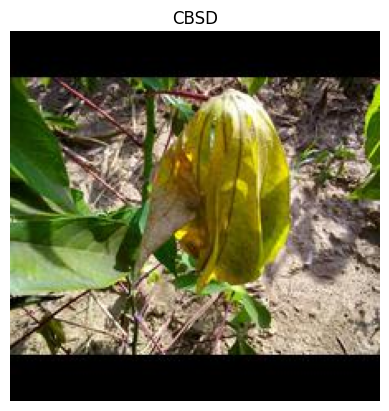

In [ ]:
show_one_image(1)   # change class id

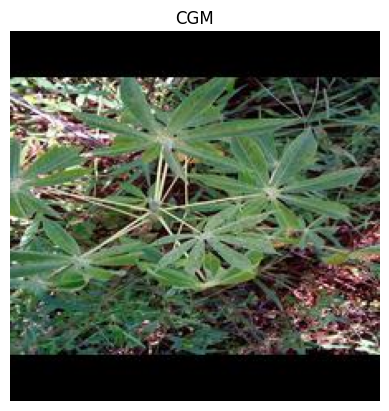

In [ ]:
show_one_image(2)   # change class id

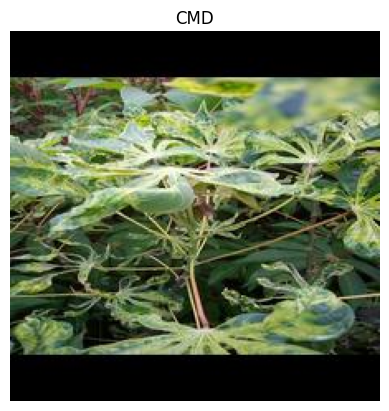

In [ ]:
show_one_image(3)   # change class id

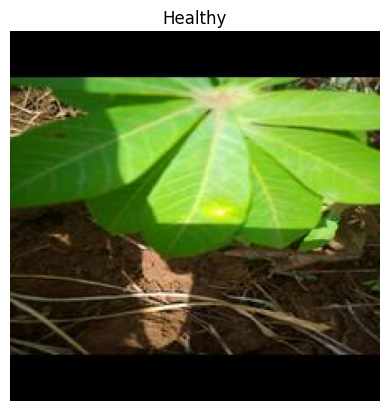

In [ ]:
show_one_image(4)   # change class id

#Function to Access 3 random images from EACH class

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os

def show_random_images_per_class(n=3):
    classes = sorted(train_df["Labels"].unique())

    plt.figure(figsize=(15, len(classes) * 3))

    for i, class_id in enumerate(classes):
        rows = train_df[train_df["Labels"] == class_id].sample(n)

        for j, (_, row) in enumerate(rows.iterrows()):
            img_path = os.path.join(TRAIN_DIR, row["ID"])
            img = Image.open(img_path)

            plt.subplot(len(classes), n, i*n + j + 1)
            plt.imshow(img)
            plt.title(label_map[str(class_id)])
            plt.axis("off")

    plt.tight_layout()
    plt.show()

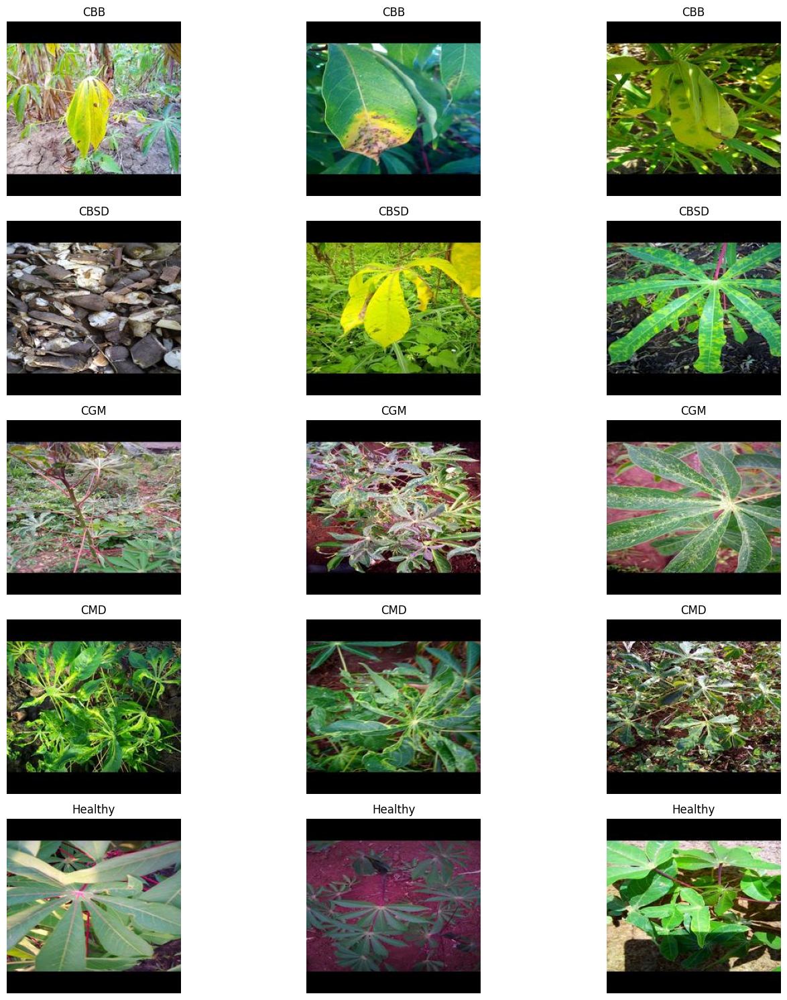

In [ ]:
show_random_images_per_class(n=3)

#Image preprocessing

In [ ]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

#Applying image preprocessing on CMD Disease of first image

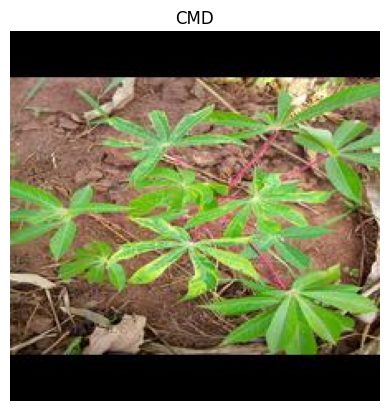

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# get one row
row = train_df.iloc[3]

# image path
image_path = os.path.join(TRAIN_DIR, row["ID"])

# label
label_id = row["Labels"]
label_name = label_map[str(label_id)]

# load image
img = Image.open(image_path)

# show image with ONLY class name
plt.imshow(img)
plt.title(label_name)
plt.axis("off")
plt.show()

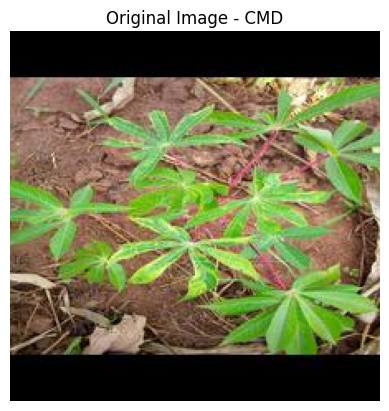

In [ ]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.title(f"Original Image - {label_name}")
plt.axis("off")
plt.show()

Resize Image

In [ ]:
def show_image(title, image, cmap=None):
    plt.figure(figsize=(5,5))
    plt.imshow(image, cmap=cmap)
    plt.title(title)
    plt.axis("off")
    plt.show()

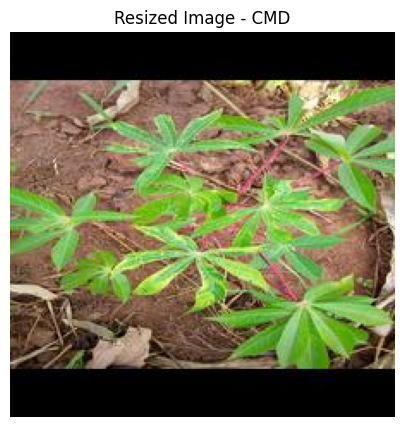

In [ ]:
resized = cv2.resize(img, (224, 224))
show_image(f"Resized Image - {label_name}", resized)

Grayscale

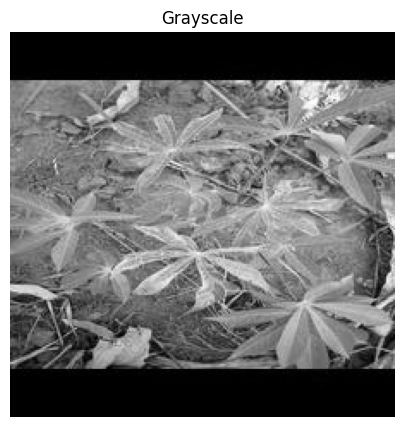

In [ ]:
gray = cv2.cvtColor(resized, cv2.COLOR_RGB2GRAY)
show_image("Grayscale", gray, cmap="gray")



Gaussian BLur

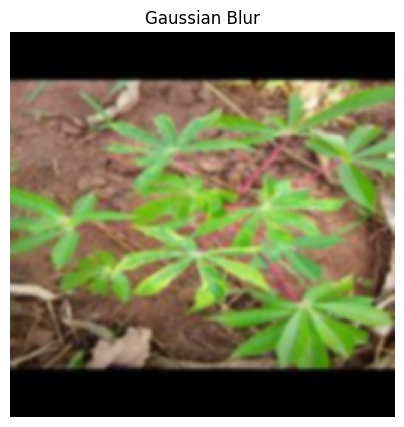

In [ ]:
gaussian_blur = cv2.GaussianBlur(resized, (5, 5), 0)
show_image("Gaussian Blur", gaussian_blur)

Median Blur

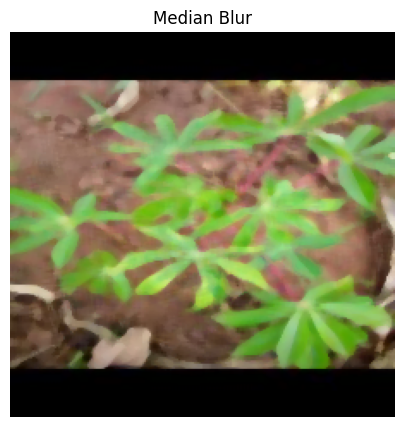

In [ ]:
median_blur = cv2.medianBlur(resized, 5)
show_image("Median Blur", median_blur)

Sharpening

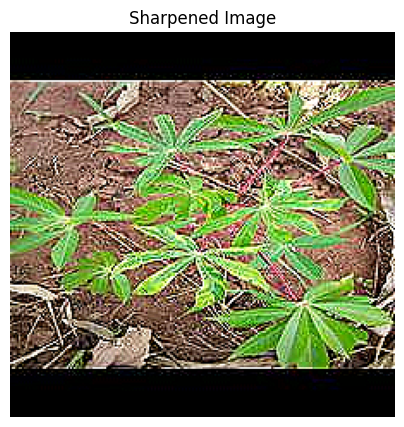

In [ ]:
sharpen_kernel = np.array([
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]
])

sharpened = cv2.filter2D(resized, -1, sharpen_kernel)
show_image("Sharpened Image", sharpened)

Histogram Equilization

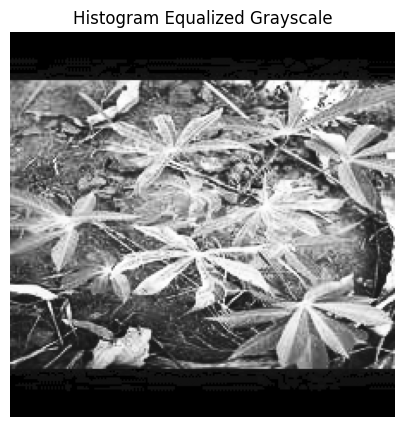

In [ ]:
gray_equalized = cv2.equalizeHist(gray)
show_image("Histogram Equalized Grayscale", gray_equalized, cmap="gray")

CLAHE enhancement

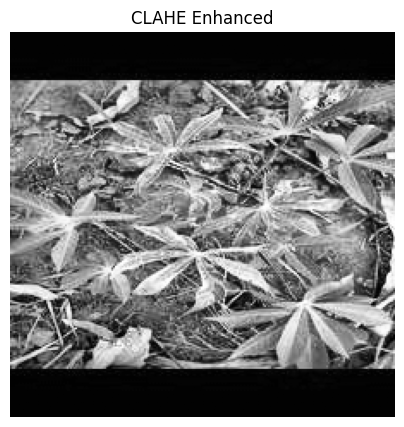

In [ ]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
clahe_img = clahe.apply(gray)

show_image("CLAHE Enhanced", clahe_img, cmap="gray")

Canny edge detection

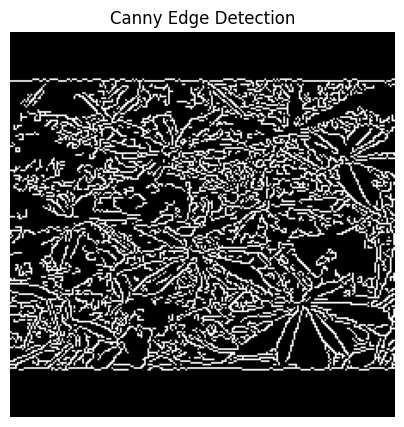

In [ ]:
edges = cv2.Canny(gray, 100, 200)
show_image("Canny Edge Detection", edges, cmap="gray")

Sobel edge detection

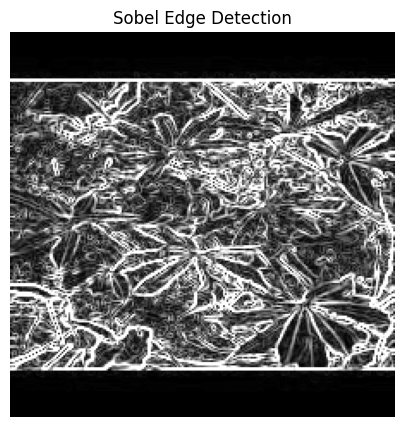

In [ ]:
sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)

sobel = cv2.magnitude(sobel_x, sobel_y)
sobel = np.uint8(np.clip(sobel, 0, 255))

show_image("Sobel Edge Detection", sobel, cmap="gray")




Thresholding

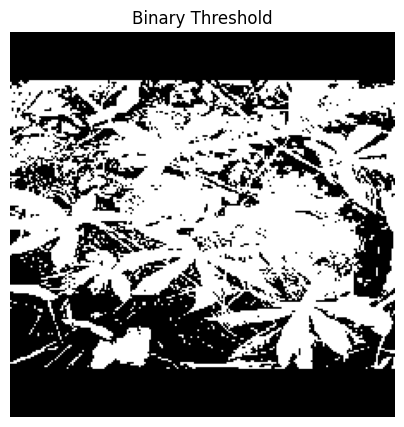

In [ ]:
_, threshold = cv2.threshold(gray, 120, 255, cv2.THRESH_BINARY)
show_image("Binary Threshold", threshold, cmap="gray")

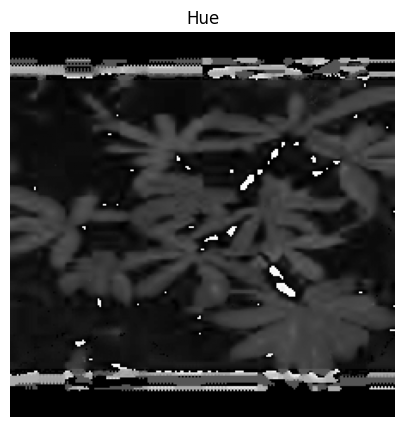

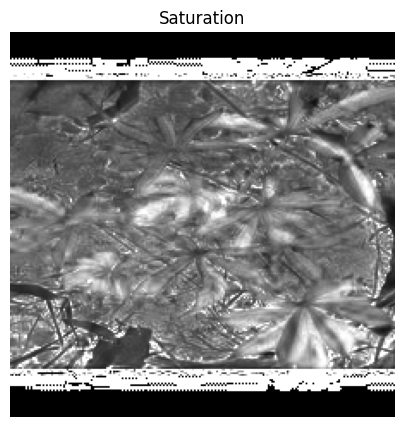

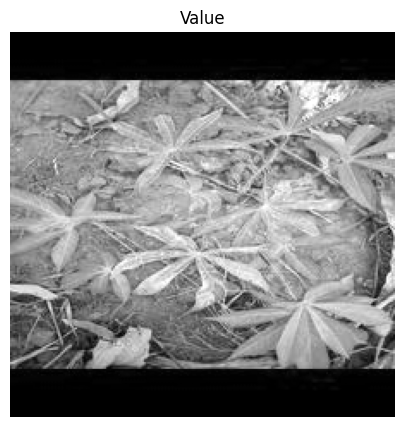

In [ ]:
hsv = cv2.cvtColor(resized, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(hsv)

show_image("Hue", h, "gray")
show_image("Saturation", s, "gray")
show_image("Value", v, "gray")

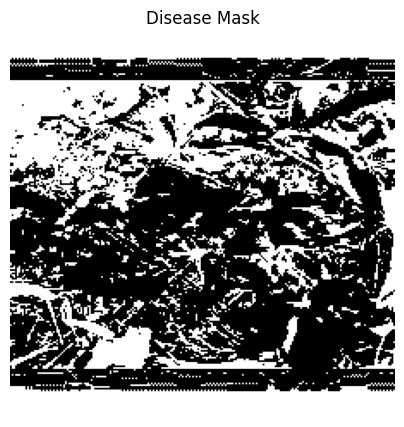

In [ ]:
_, mask = cv2.threshold(s, 100, 255, cv2.THRESH_BINARY_INV)
show_image("Disease Mask", mask, "gray")

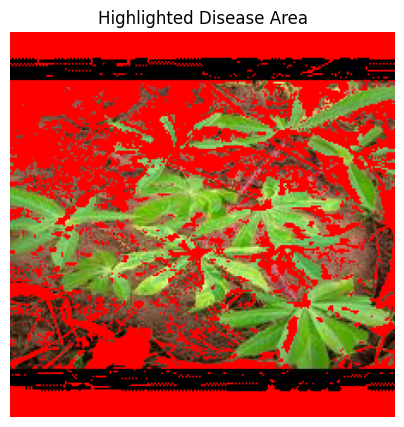

In [ ]:
highlight = resized.copy()
highlight[mask == 255] = [255, 0, 0]

show_image("Highlighted Disease Area", highlight)

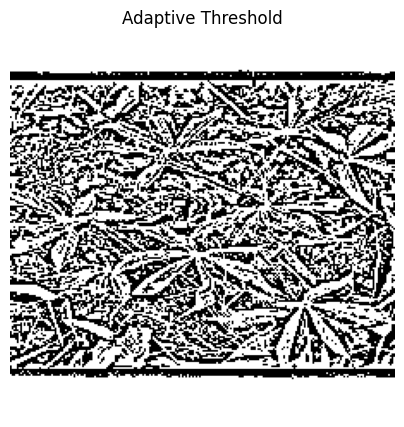

In [ ]:
adaptive_threshold = cv2.adaptiveThreshold(
    gray,
    255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY,
    11,
    2
)

show_image("Adaptive Threshold", adaptive_threshold, cmap="gray")

Morphological operations

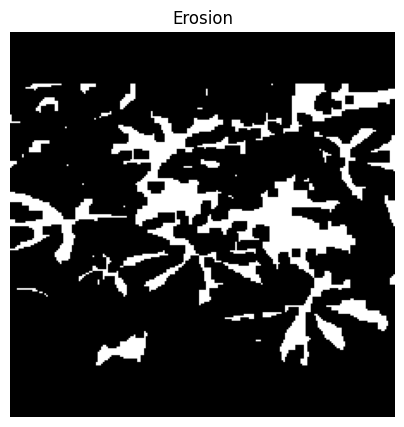

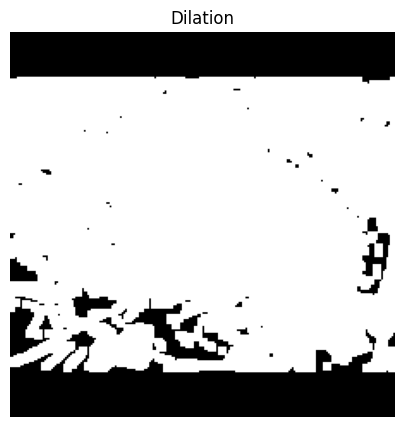

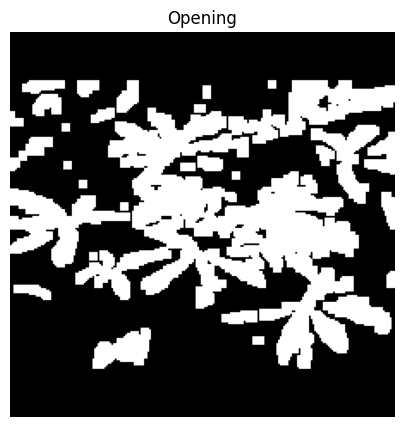

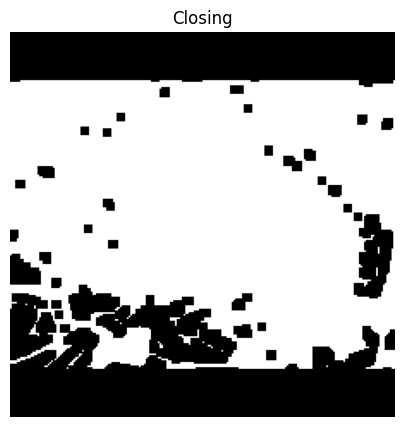

In [ ]:
kernel = np.ones((5,5), np.uint8)

erosion = cv2.erode(threshold, kernel, iterations=1)
dilation = cv2.dilate(threshold, kernel, iterations=1)
opening = cv2.morphologyEx(threshold, cv2.MORPH_OPEN, kernel)
closing = cv2.morphologyEx(threshold, cv2.MORPH_CLOSE, kernel)

show_image("Erosion", erosion, cmap="gray")
show_image("Dilation", dilation, cmap="gray")
show_image("Opening", opening, cmap="gray")
show_image("Closing", closing, cmap="gray")

HSV color space

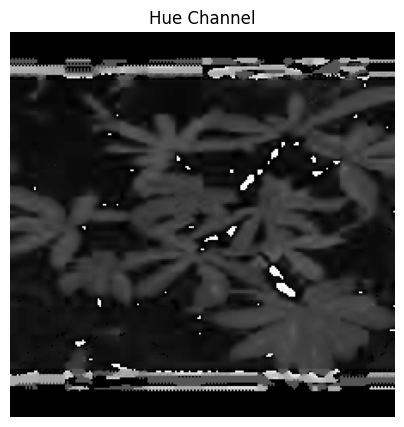

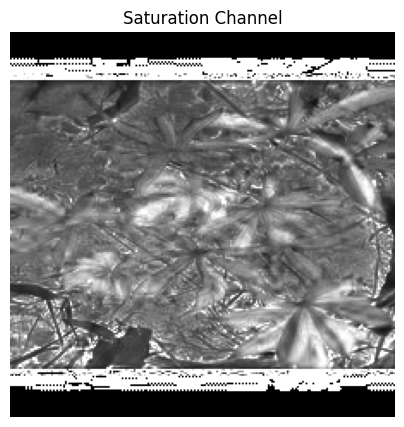

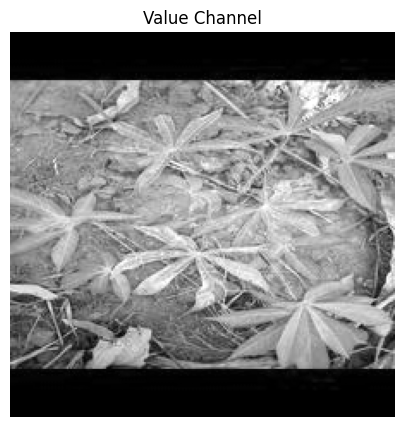

In [ ]:
hsv = cv2.cvtColor(resized, cv2.COLOR_RGB2HSV)

h, s, v = cv2.split(hsv)

show_image("Hue Channel", h, cmap="gray")
show_image("Saturation Channel", s, cmap="gray")
show_image("Value Channel", v, cmap="gray")

RGB histogram

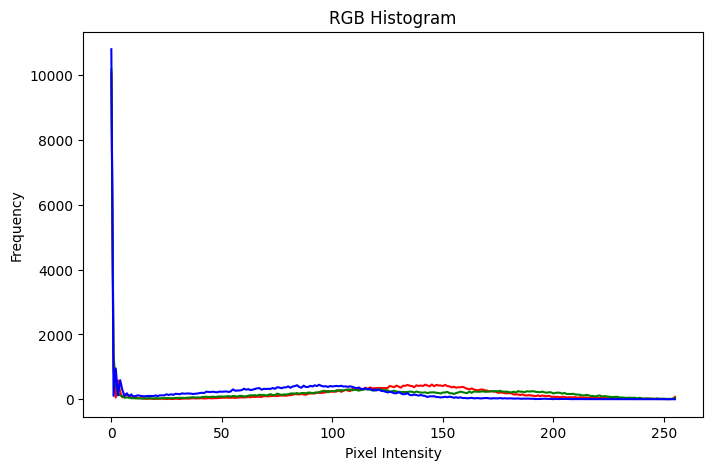

In [ ]:
colors = ("red", "green", "blue")

plt.figure(figsize=(8,5))

for i, color in enumerate(colors):
    hist = cv2.calcHist([resized], [i], None, [256], [0,256])
    plt.plot(hist, color=color)

plt.title("RGB Histogram")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.show()

Show everything in one grid

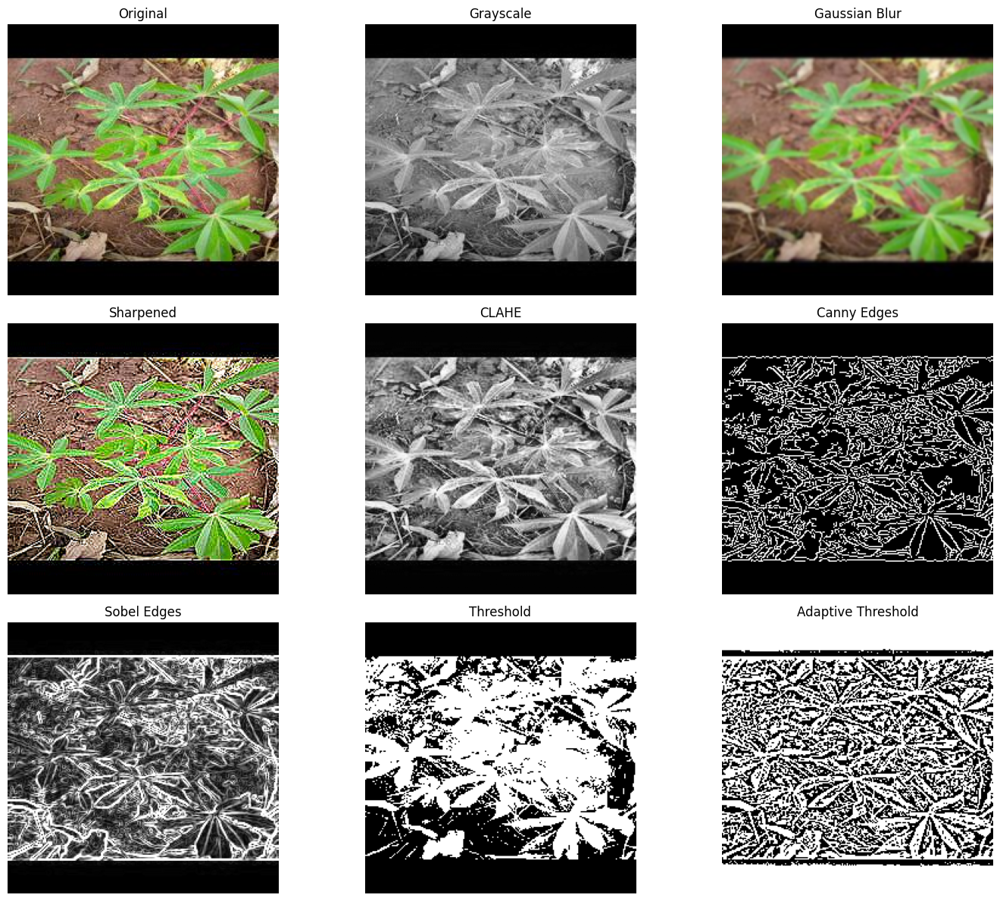

In [ ]:
images = [
    ("Original", resized, None),
    ("Grayscale", gray, "gray"),
    ("Gaussian Blur", gaussian_blur, None),
    ("Sharpened", sharpened, None),
    ("CLAHE", clahe_img, "gray"),
    ("Canny Edges", edges, "gray"),
    ("Sobel Edges", sobel, "gray"),
    ("Threshold", threshold, "gray"),
    ("Adaptive Threshold", adaptive_threshold, "gray")
]

plt.figure(figsize=(15, 12))

for i, (title, image, cmap) in enumerate(images):
    plt.subplot(3, 3, i + 1)
    plt.imshow(image, cmap=cmap)
    plt.title(title)
    plt.axis("off")

plt.tight_layout()
plt.show()

#Image Generator

In [ ]:
# Removed !pip install keras-shufflenet-v2 as it seems unavailable or problematic

In [ ]:
train_df = pd.read_csv('/content/dataset_sir/main_dataset/Train/Train.csv')
test_df  = pd.read_csv('/content/dataset_sir/main_dataset/Test/Test.csv')

# IMPORTANT → keep labels as strings for ImageDataGenerator sparse mode
train_df['Labels'] = train_df['Labels'].astype(str)
test_df['Labels']  = test_df['Labels'].astype(str)

In [ ]:
IMG_SIZE = 224
BATCH_SIZE = 32

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.2,
    horizontal_flip=True
)

val_datagen = ImageDataGenerator(
    rescale=1./255
)

train_gen = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory='/content/dataset_sir/main_dataset/Train/Train_Images',
    x_col='ID',
    y_col='Labels',
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='sparse',
    shuffle=True
)

val_gen = val_datagen.flow_from_dataframe(
    dataframe=test_df,
    directory='/content/dataset_sir/main_dataset/Test/Test_images',
    x_col='ID',
    y_col='Labels',
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='sparse',
    shuffle=False
)

Found 4000 validated image filenames belonging to 5 classes.
Found 1000 validated image filenames belonging to 5 classes.


In [ ]:
print(train_gen.class_indices)

{'0': 0, '1': 1, '2': 2, '3': 3, '4': 4}


#ShuffleNet Model

In [ ]:
def fire_module(x, squeeze=16, expand=64):
    s = Conv2D(squeeze, (1,1), activation='relu', padding='same')(x)

    e1 = Conv2D(expand, (1,1), activation='relu', padding='same')(s)
    e3 = Conv2D(expand, (3,3), activation='relu', padding='same')(s)

    return Concatenate()([e1, e3])


def SqueezeNet(input_shape=(224,224,3), classes=5):
    input_img = Input(shape=input_shape)

    x = Conv2D(96, (7,7), strides=2, activation='relu')(input_img)
    x = MaxPooling2D(pool_size=(3,3), strides=2)(x)

    x = fire_module(x, 16, 64)
    x = fire_module(x, 16, 64)
    x = fire_module(x, 32, 128)
    x = MaxPooling2D(pool_size=(3,3), strides=2)(x)

    x = fire_module(x, 32, 128)
    x = fire_module(x, 48, 192)
    x = fire_module(x, 48, 192)
    x = fire_module(x, 64, 256)
    x = MaxPooling2D(pool_size=(3,3), strides=2)(x)

    x = fire_module(x, 64, 256)

    x = Dropout(0.5)(x)

    # 🔥 FIXED (no relu here)
    x = Conv2D(classes, (1,1))(x)

    x = GlobalAveragePooling2D()(x)
    output = Activation('softmax')(x)

    model = Model(input_img, output)
    return model


model = SqueezeNet(input_shape=(224,224,3), classes=5)

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)

model.compile(
    optimizer=optimizer,
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_78 (Conv2D)  │ (None, 109, 109,  │     14,208 │ input_layer_3[0]… │
│                     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_9     │ (None, 54, 54,    │          0 │ conv2d_78[0][0]   │
│ (MaxPooling2D)      │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_79 (Conv2D)  │ (None, 54, 54,    │      1,552 │ max_pooling2d_9[… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_80 (Conv2D)  │ (None, 54, 54,    │      1,088 │ conv2d_79[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_81 (Conv2D)  │ (None, 54, 54,    │      9,280 │ conv2d_79[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_24      │ (None, 54, 54,    │          0 │ conv2d_80[0][0],  │
│ (Concatenate)       │ 128)              │            │ conv2d_81[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_82 (Conv2D)  │ (None, 54, 54,    │      2,064 │ concatenate_24[0… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_83 (Conv2D)  │ (None, 54, 54,    │      1,088 │ conv2d_82[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_84 (Conv2D)  │ (None, 54, 54,    │      9,280 │ conv2d_82[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_25      │ (None, 54, 54,    │          0 │ conv2d_83[0][0],  │
│ (Concatenate)       │ 128)              │            │ conv2d_84[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_85 (Conv2D)  │ (None, 54, 54,    │      4,128 │ concatenate_25[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_86 (Conv2D)  │ (None, 54, 54,    │      4,224 │ conv2d_85[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_87 (Conv2D)  │ (None, 54, 54,    │     36,992 │ conv2d_85[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_26      │ (None, 54, 54,    │          0 │ conv2d_86[0][0],  │
│ (Concatenate)       │ 256)              │            │ conv2d_87[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_10    │ (None, 26, 26,    │          0 │ concatenate_26[0… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_88 (Conv2D)  │ (None, 26, 26,    │      8,224 │ max_pooling2d_10

 Total params: 737,989 (2.82 MB)

 Trainable params: 737,989 (2.82 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

callbacks = [
    EarlyStopping(patience=5, restore_best_weights=True),
    ReduceLROnPlateau(patience=3)
]

In [ ]:
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=20,
    callbacks=callbacks
)

Epoch 1/20
125/125 ━━━━━━━━━━━━━━━━━━━━ 55s 436ms/step - accuracy: 0.1870 - loss: 1.6095 - val_accuracy: 0.2000 - val_loss: 1.6094 - learning_rate: 1.0000e-04
Epoch 2/20
125/125 ━━━━━━━━━━━━━━━━━━━━ 53s 424ms/step - accuracy: 0.2457 - loss: 1.5847 - val_accuracy: 0.3130 - val_loss: 1.5333 - learning_rate: 1.0000e-04
Epoch 3/20
125/125 ━━━━━━━━━━━━━━━━━━━━ 53s 428ms/step - accuracy: 0.2885 - loss: 1.5403 - val_accuracy: 0.3080 - val_loss: 1.4983 - learning_rate: 1.0000e-04
Epoch 4/20
125/125 ━━━━━━━━━━━━━━━━━━━━ 53s 423ms/step - accuracy: 0.3075 - loss: 1.5117 - val_accuracy: 0.3180 - val_loss: 1.4773 - learning_rate: 1.0000e-04
Epoch 5/20
125/125 ━━━━━━━━━━━━━━━━━━━━ 52s 414ms/step - accuracy: 0.3145 - loss: 1.4799 - val_accuracy: 0.3280 - val_loss: 1.4409 - learning_rate: 1.0000e-04
Epoch 6/20
125/125 ━━━━━━━━━━━━━━━━━━━━ 53s 420ms/step - accuracy: 0.3298 - loss: 1.4515 - val_accuracy: 0.3320 - val_loss: 1.4301 - learning_rate: 1.0000e-04
Epoch 7/20
125/125 ━━━━━━━━━━━━━━━━━━━━ 53s 42

In [ ]:
for layer in model.layers:
    layer.trainable = True

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=10
)

Epoch 1/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 69s 440ms/step - accuracy: 0.4153 - loss: 1.3194 - val_accuracy: 0.4140 - val_loss: 1.3069
Epoch 2/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 52s 420ms/step - accuracy: 0.4252 - loss: 1.3141 - val_accuracy: 0.4240 - val_loss: 1.3091
Epoch 3/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 52s 414ms/step - accuracy: 0.4257 - loss: 1.3121 - val_accuracy: 0.4200 - val_loss: 1.3058
Epoch 4/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 51s 405ms/step - accuracy: 0.4293 - loss: 1.3093 - val_accuracy: 0.4350 - val_loss: 1.2980
Epoch 5/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 53s 421ms/step - accuracy: 0.4293 - loss: 1.3096 - val_accuracy: 0.4250 - val_loss: 1.3016
Epoch 6/10
 46/125 ━━━━━━━━━━━━━━━━━━━━ 36s 459ms/step - accuracy: 0.4290 - loss: 1.2971

KeyboardInterrupt: 

#MobileNet Model

In [ ]:
from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model

base_model = MobileNetV3Small(
    input_shape=(224,224,3),
    include_top=False,
    weights='imagenet'
)

for layer in base_model.layers:
    layer.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)

x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)

output = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=output)

model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

4334752/4334752 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
from tensorflow.keras.applications.mobilenet_v3 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=20,
    zoom_range=0.2,
    horizontal_flip=True
)

val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

In [ ]:
train_gen = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=TRAIN_DIR,
    x_col='ID',
    y_col='Labels',
    target_size=(224,224),
    batch_size=32,
    class_mode='sparse',
    shuffle=True
)

val_gen = val_datagen.flow_from_dataframe(
    dataframe=test_df,
    directory=TEST_DIR,
    x_col='ID',
    y_col='Labels',
    target_size=(224,224),
    batch_size=32,
    class_mode='sparse',
    shuffle=False
)

Found 4000 validated image filenames belonging to 5 classes.
Found 1000 validated image filenames belonging to 5 classes.


In [ ]:
print(base_model.weights[0].numpy().mean())

-0.0023345947


In [ ]:
print(train_gen.image_data_generator.preprocessing_function)

<function preprocess_input at 0x7bd515de3c40>


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

callbacks = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ReduceLROnPlateau(patience=2)
]

history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=10,
    callbacks=callbacks
)

Epoch 1/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 69s 557ms/step - accuracy: 0.4098 - loss: 1.4710 - val_accuracy: 0.5260 - val_loss: 1.2063 - learning_rate: 0.0010
Epoch 2/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 47s 376ms/step - accuracy: 0.4843 - loss: 1.2432 - val_accuracy: 0.5540 - val_loss: 1.1387 - learning_rate: 0.0010
Epoch 3/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 48s 384ms/step - accuracy: 0.5153 - loss: 1.2012 - val_accuracy: 0.5680 - val_loss: 1.1091 - learning_rate: 0.0010
Epoch 4/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 55s 441ms/step - accuracy: 0.5268 - loss: 1.1565 - val_accuracy: 0.5540 - val_loss: 1.1002 - learning_rate: 0.0010
Epoch 5/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 51s 403ms/step - accuracy: 0.5285 - loss: 1.1492 - val_accuracy: 0.5740 - val_loss: 1.0843 - learning_rate: 0.0010
Epoch 6/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 47s 378ms/step - accuracy: 0.5410 - loss: 1.1358 - val_accuracy: 0.5620 - val_loss: 1.0836 - learning_rate: 0.0010
Epoch 7/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 48s 388ms/step - accuracy: 0.5

In [ ]:
val_loss, val_acc = model.evaluate(val_gen)
print("Validation Accuracy:", val_acc)

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.6000 - loss: 1.0284
Validation Accuracy: 0.6000000238418579


In [ ]:
# unfreeze more layers
for layer in base_model.layers[-40:]:
    layer.trainable = True

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

history_fine = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=10
)

Epoch 1/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 78s 501ms/step - accuracy: 0.4650 - loss: 1.3317 - val_accuracy: 0.5970 - val_loss: 1.0336
Epoch 2/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 48s 381ms/step - accuracy: 0.4958 - loss: 1.2260 - val_accuracy: 0.5930 - val_loss: 1.0361
Epoch 3/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 48s 387ms/step - accuracy: 0.5217 - loss: 1.1677 - val_accuracy: 0.5910 - val_loss: 1.0347
Epoch 4/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 81s 379ms/step - accuracy: 0.5345 - loss: 1.1448 - val_accuracy: 0.5940 - val_loss: 1.0304
Epoch 5/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 48s 383ms/step - accuracy: 0.5397 - loss: 1.1360 - val_accuracy: 0.5880 - val_loss: 1.0261
Epoch 6/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 47s 372ms/step - accuracy: 0.5500 - loss: 1.1127 - val_accuracy: 0.5950 - val_loss: 1.0211
Epoch 7/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 50s 398ms/step - accuracy: 0.5550 - loss: 1.1042 - val_accuracy: 0.5890 - val_loss: 1.0195
Epoch 8/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 47s 376ms/step - accuracy: 0.5695 - loss: 1

In [ ]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix

y_pred = model.predict(val_gen)
y_pred_classes = np.argmax(y_pred, axis=1)

y_true = val_gen.classes

print(confusion_matrix(y_true, y_pred_classes))
print(classification_report(y_true, y_pred_classes))

32/32 ━━━━━━━━━━━━━━━━━━━━ 11s 212ms/step
[[137  20   8   9  26]
 [ 37  97  18  18  30]
 [ 11   7 112  49  21]
 [  6   4  22 160   8]
 [ 44  14  28  20  94]]
              precision    recall  f1-score   support

           0       0.58      0.69      0.63       200
           1       0.68      0.48      0.57       200
           2       0.60      0.56      0.58       200
           3       0.62      0.80      0.70       200
           4       0.53      0.47      0.50       200

    accuracy                           0.60      1000
   macro avg       0.60      0.60      0.59      1000
weighted avg       0.60      0.60      0.59      1000



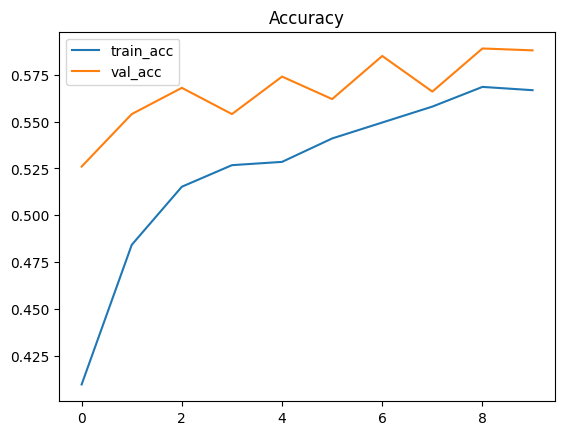

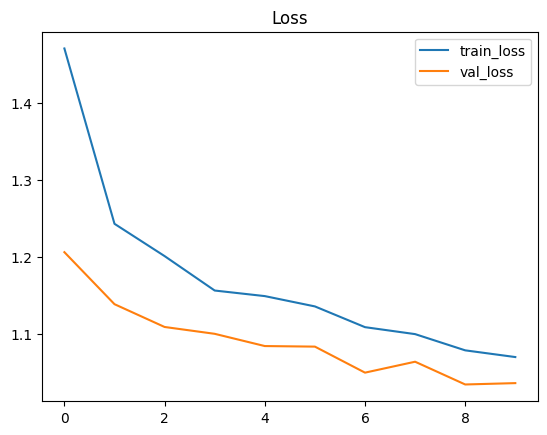

In [ ]:
import matplotlib.pyplot as plt

# Accuracy graph
plt.plot(history.history['accuracy'], label='train_acc')
plt.plot(history.history['val_accuracy'], label='val_acc')
plt.legend()
plt.title("Accuracy")
plt.show()

# Loss graph
plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.legend()
plt.title("Loss")
plt.show()

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Predict
y_pred = model.predict(val_gen)
y_pred_classes = np.argmax(y_pred, axis=1)

# True labels
y_true = val_gen.classes

# Create confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

32/32 ━━━━━━━━━━━━━━━━━━━━ 16s 226ms/step


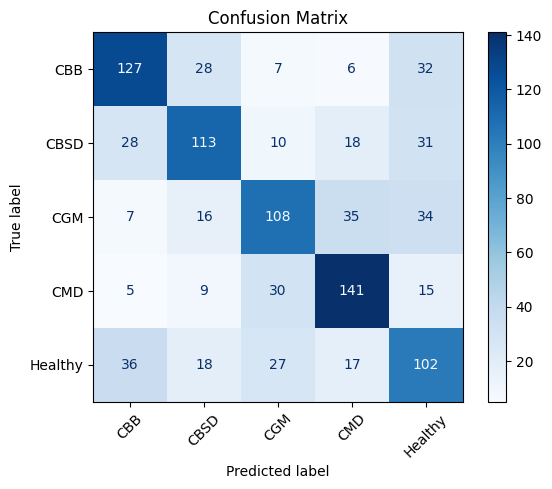

In [ ]:
import matplotlib.pyplot as plt

class_names = ['CBB', 'CBSD', 'CGM', 'CMD', 'Healthy']

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap='Blues', xticks_rotation=45)

plt.title("Confusion Matrix")
plt.show()

In [ ]:
import numpy as np
import cv2
from tensorflow.keras.applications.mobilenet_v3 import preprocess_input
import matplotlib.pyplot as plt

def load_image(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    img_resized = cv2.resize(img, (224, 224))
    img_preprocessed = preprocess_input(img_resized)

    img_final = np.expand_dims(img_preprocessed, axis=0)

    return img, img_final

In [ ]:
import os

print(os.path.exists("/content/test_image.jpg"))

False


Predicting for image: 3184759653.jpg
True label: CBB
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step

Prediction: CMD
Confidence: 0.60591125


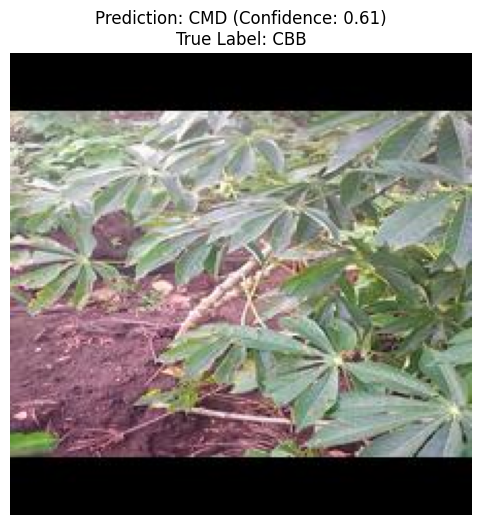

In [ ]:
import random

# class mapping
class_names = ['CBB', 'CBSD', 'CGM', 'CMD', 'Healthy']

# Get a random image from the test set
random_row = test_df.sample(1).iloc[0]
img_id = random_row['ID']
true_label_id = random_row['Labels']

img_path = os.path.join(TEST_DIR, img_id)

print(f"Predicting for image: {img_id}")
print(f"True label: {class_names[int(true_label_id)]}")

# load image
img_original, img_input = load_image(img_path)

# predict
pred = model.predict(img_input)
class_id = np.argmax(pred)
confidence = np.max(pred)

print("\nPrediction:", class_names[class_id])
print("Confidence:", confidence)

# Display the image with prediction
plt.figure(figsize=(6,6))
plt.imshow(img_original)
plt.title(f"Prediction: {class_names[class_id]} (Confidence: {confidence:.2f})\nTrue Label: {class_names[int(true_label_id)]}")
plt.axis("off")
plt.show()

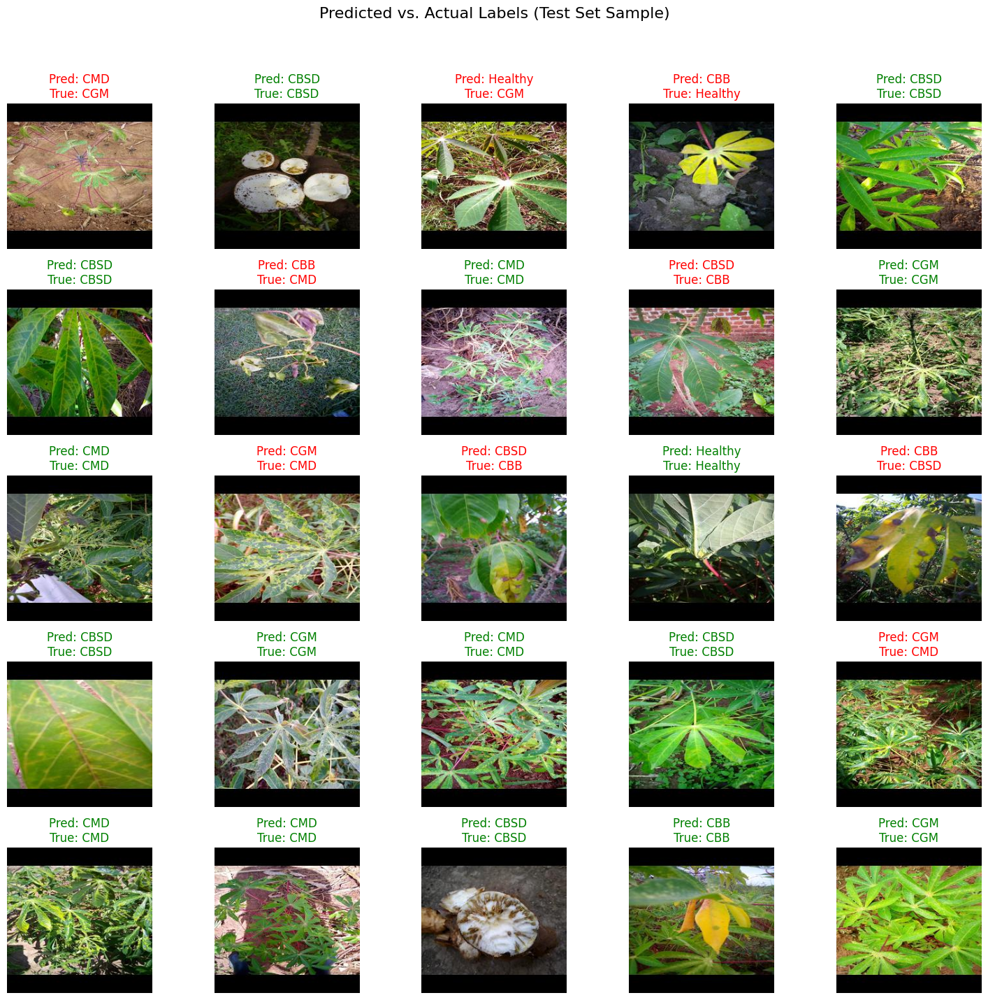

In [ ]:
import random

# Get random indices for a sample of images
num_samples_to_display = 25 # Display 25 images in a 5x5 grid
random_indices = random.sample(range(len(test_df)), num_samples_to_display)

plt.figure(figsize=(15, 15))
plt.suptitle("Predicted vs. Actual Labels (Test Set Sample)", fontsize=16)

for i, df_index in enumerate(random_indices):
    img_id = test_df.iloc[df_index]['ID']
    true_label_id = int(test_df.iloc[df_index]['Labels']) # Ensure integer for indexing class_names

    # Assuming direct correspondence between test_df.index and y_pred_classes index
    # (since val_gen was created with shuffle=False)
    predicted_label_id = y_pred_classes[df_index]

    img_path = os.path.join(TEST_DIR, img_id)
    img_original, _ = load_image(img_path) # load_image returns original and preprocessed

    plt.subplot(5, 5, i + 1)
    plt.imshow(img_original)

    predicted_name = class_names[predicted_label_id]
    true_name = class_names[true_label_id]

    color = "green" if predicted_label_id == true_label_id else "red"
    title_text = f"Pred: {predicted_name}\nTrue: {true_name}"
    plt.title(title_text, color=color)
    plt.axis("off")

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent suptitle overlap
plt.show()

In [ ]:
print("Misclassification Rate Per Class:")
for i, class_name in enumerate(class_names):
    # Total samples for the current class (sum of the row)
    total_samples_in_class = np.sum(cm[i, :])
    # Correctly classified samples for the current class (diagonal element)
    correctly_classified = cm[i, i]
    # Misclassified samples for the current class
    misclassified = total_samples_in_class - correctly_classified
    # Misclassification rate
    misclassification_rate = misclassified / total_samples_in_class
    print(f"  {class_name}: {misclassification_rate:.4f}")

Misclassification Rate Per Class:
  CBB: 0.3650
  CBSD: 0.4350
  CGM: 0.4600
  CMD: 0.2950
  Healthy: 0.4900


In [ ]:
model.save("shufflenet_model.h5")

In [ ]:
model.save("shufflenet_model.keras")

In [ ]:
import tensorflow as tf

model = tf.keras.models.load_model("shufflenet_model.keras")

In [ ]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)

tflite_model = converter.convert()

# Save model
with open("shufflenet_model.tflite", "wb") as f:
    f.write(tflite_model)

Saved artifact at '/tmp/tmpj6yn073p'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_layer_4')
Output Type:
  TensorSpec(shape=(None, 5), dtype=tf.float32, name=None)
Captures:
  136151559320208: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136151559318096: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136151559314832: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136151559318288: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136151559320976: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136151559316176: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136151559321552: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136151559317328: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136151559315216: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136151559321360: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1361515593159

In [ ]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

with open('cassava_model.tflite', 'wb') as f:
    f.write(tflite_model)

Saved artifact at '/tmp/tmpnebd6muv'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_layer_4')
Output Type:
  TensorSpec(shape=(None, 5), dtype=tf.float32, name=None)
Captures:
  136151559320208: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136151559318096: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136151559314832: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136151559318288: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136151559320976: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136151559316176: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136151559321552: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136151559317328: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136151559315216: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136151559321360: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1361515593159